# Objective:
Predict whether a person will default on loan or not, based on the given attributes.

# Meta Data-
The data set HMEQ reports characteristics and delinquency information for 5,960 home equity loans. A home equity loan is a loan where the obligor uses the equity of his or her home as the underlying collateral. The data set has the following characteristics:

■ BAD: 1 = applicant defaulted on loan or seriously delinquent; 0= applicant paid loan (Target Variable){Assymetric Binnary Nominal}

■ LOAN: Amount of the loan request{Ratio-Scaled Numeric}

■ MORTDUE: Amount due on existing mortgage{Ratio-Scaled Numeric}

■ VALUE: Value of current property{Ratio-Scaled Numeric}

■ REASON: DebtCon = debt consolidation; Homelmp home improvement{Nominal}

■ JOB: Occupational categories{Nominal}

■ YOJ: Years at present job

■ DEROG: Number of major derogatory reports

■ DELINQ: Number of delinquent credit lines

■ CLAGE: Age of oldest credit line in months

■ NINQ: Number of recent credit inquiries

■ CLNO: Number of credit lines

■ DEBTINC: Debt-to-income ratio{Ratio-Scaled Numeric}

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load DataSet

In [ ]:
path = '/content/drive/MyDrive/Colab Notebooks/hmeq.csv'
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/hmeq.csv")
data.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Quality Check

In [ ]:
data.shape

(5960, 13)

In [ ]:
data.dtypes

BAD          int64
LOAN         int64
MORTDUE    float64
VALUE      float64
REASON      object
JOB         object
YOJ        float64
DEROG      float64
DELINQ     float64
CLAGE      float64
NINQ       float64
CLNO       float64
DEBTINC    float64
dtype: object

In [ ]:
data.describe()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
count,5960.000000,5960.000000,5442.000000,5848.000000,5445.000000,5252.000000,5380.000000,5652.000000,5450.000000,5738.000000,4693.000000
mean,0.199497,18607.969799,73760.817200,101776.048741,8.922268,0.254570,0.449442,179.766275,1.186055,21.296096,33.779915
std,0.399656,11207.480417,44457.609458,57385.775334,7.573982,0.846047,1.127266,85.810092,1.728675,10.138933,8.601746
min,0.000000,1100.000000,2063.000000,8000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.524499
25%,0.000000,11100.000000,46276.000000,66075.500000,3.000000,0.000000,0.000000,115.116702,0.000000,15.000000,29.140031
50%,0.000000,16300.000000,65019.000000,89235.500000,7.000000,0.000000,0.000000,173.466667,1.000000,20.000000,34.818262
75%,0.000000,23300.000000,91488.000000,119824.250000,13.000000,0.000000,0.000000,231.562278,2.000000,26.000000,39.003141
max,1.000000,89900.000000,399550.000000,855909.000000,41.000000,10.000000,15.000000,1168.233561,17.000000,71.000000,203.312149


In [ ]:
# Data Missing Check
data.isnull().sum()

BAD           0
LOAN          0
MORTDUE     518
VALUE       112
REASON      252
JOB         279
YOJ         515
DEROG       708
DELINQ      580
CLAGE       308
NINQ        510
CLNO        222
DEBTINC    1267
dtype: int64

In [ ]:
data.duplicated().sum()

0

# DATA IMPUTATION

In [ ]:
num_columns = ["MORTDUE","VALUE","YOJ","DEROG","DELINQ","CLAGE","NINQ","CLNO","DEBTINC"]

for column in num_columns:
    data.loc[data[column].isnull(), column] = data[column].mean()

data.isnull().sum()

BAD          0
LOAN         0
MORTDUE      0
VALUE        0
REASON     252
JOB        279
YOJ          0
DEROG        0
DELINQ       0
CLAGE        0
NINQ         0
CLNO         0
DEBTINC      0
dtype: int64

In [ ]:
cat_columns = ["REASON","JOB"]

for column in cat_columns:
    data.loc[data[column].isnull(), column] = str(data[column].mode())
data.isnull().sum()

BAD        0
LOAN       0
MORTDUE    0
VALUE      0
REASON     0
JOB        0
YOJ        0
DEROG      0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
DEBTINC    0
dtype: int64

# Data Preprocessing

## Advance Categorical Encoder

In [ ]:
data.sample(10)

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
5233,0,28400,72870.0000,95647.0,DebtCon,Office,11.000000,0.0,0.000000,139.045255,0.000000,20.0,37.820678
4533,0,23600,56023.0000,83659.0,DebtCon,Mgr,5.000000,0.0,0.000000,267.755535,2.000000,25.0,32.200781
2382,0,14300,89984.0000,121189.0,HomeImp,Mgr,4.000000,0.0,2.000000,137.597823,0.000000,25.0,41.613325
5416,1,31800,60279.0000,97875.0,DebtCon,Mgr,6.000000,0.0,11.000000,312.433333,0.000000,46.0,33.779915
5718,0,42200,73760.8172,55578.0,DebtCon,Other,8.922268,6.0,0.449442,115.878189,1.186055,20.0,28.238412
4736,0,25000,126462.0000,207200.0,DebtCon,ProfExe,10.000000,0.0,0.000000,239.800000,3.000000,27.0,33.779915
1955,0,12800,56516.0000,78392.0,HomeImp,Other,0.000000,0.0,1.000000,195.723322,0.000000,13.0,27.337441
224,0,5300,97132.0000,117343.0,HomeImp,Office,22.000000,0.0,0.000000,109.933908,1.000000,11.0,35.838543
2181,0,13500,67180.0000,85634.0,DebtCon,Sales,5.000000,0.0,0.000000,147.355313,0.000000,35.0,28.522553
275,1,5700,70000.0000,84579.0,DebtCon,Sales,0.100000,0.0,0.000000,95.900000,1.000000,17.0,33.779915


In [ ]:
data["JOB"].unique()

array(['Other', '0    Other\ndtype: object', 'Office', 'Sales', 'Mgr',
       'ProfExe', 'Self'], dtype=object)

In [ ]:
data["JOB"] = data["JOB"].replace(["0    Other\ndtype: object"],"Other")
data["JOB"].unique()

array(['Other', 'Office', 'Sales', 'Mgr', 'ProfExe', 'Self'], dtype=object)

In [ ]:
data["REASON"].unique()

array(['HomeImp', '0    DebtCon\ndtype: object', 'DebtCon'], dtype=object)

In [ ]:
data["REASON"] = data["REASON"].replace(["0    DebtCon\ndtype: object"],"DebtCon")
data["REASON"].unique()

array(['HomeImp', 'DebtCon'], dtype=object)

In [ ]:
list_jobcode = []
for i , kolom in data.iterrows():
  if kolom["JOB"]=="Other":
    jobcode = 1
  if kolom["JOB"]=="Office":
    jobcode = 2
  if kolom["JOB"]=="Sales":
    jobcode = 3
  if kolom["JOB"]=="Mgr":
    jobcode = 4
  if kolom["JOB"]=="ProfExe":
    jobcode = 5
  if kolom["JOB"]=="Self":
    jobcode = 6
  list_jobcode.append(jobcode)
data["Job Code"] = list_jobcode
data.sample(15)

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code
800,0,8500,50031.0000,57276.0,DebtCon,Office,0.000000,0.00000,0.000000,171.212815,0.000000,21.0,35.158703,2
730,0,8200,67489.0000,80145.0,HomeImp,Other,2.000000,0.00000,0.000000,104.396507,0.000000,7.0,36.912311,1
3693,0,19400,71515.0000,100771.0,DebtCon,Other,8.922268,1.00000,1.000000,223.171084,2.000000,13.0,40.705044,1
1388,0,10700,51224.0000,70399.0,DebtCon,Mgr,5.000000,0.25457,0.449442,110.677442,1.186055,23.0,42.939294,4
543,0,7400,32832.0000,50798.0,DebtCon,Other,10.000000,0.00000,0.000000,221.338421,1.000000,31.0,36.009421,1
4216,0,22000,36738.0000,100040.0,HomeImp,Other,6.000000,0.00000,0.000000,138.942458,0.000000,14.0,30.783154,1
2494,0,14900,45701.0000,78186.0,DebtCon,Mgr,5.000000,0.00000,0.000000,125.031353,1.000000,8.0,26.343856,4
322,0,6000,73760.8172,43300.0,HomeImp,Other,8.922268,0.25457,0.449442,100.933333,1.186055,9.0,33.779915,1
1299,0,10400,57816.0000,82047.0,HomeImp,Other,3.000000,0.00000,1.000000,176.656895,0.000000,12.0,30.674205,1
910,1,9000,52311.0000,68994.0,DebtCon,Office,0.000000,0.00000,1.000000,137.784004,0.000000,9.0,28.454713,2


In [ ]:
list_reason = []
for i , kolom in data.iterrows():
  if kolom["REASON"]=="HomeImp":
    reason = 1
  else:
    reason = 2
  list_reason.append(reason)
data["Reason Code"] = list_reason
data.sample(15)

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
1119,0,9900,74009.0000,108371.0,DebtCon,Office,1.000000,0.00000,0.000000,246.094765,0.000000,36.000000,17.257117,2,2
787,1,8400,32000.0000,49000.0,HomeImp,Mgr,12.600000,0.00000,3.000000,41.300000,2.000000,18.000000,33.779915,4,1
3015,0,16500,64992.0000,97348.0,HomeImp,Office,8.000000,0.25457,0.449442,123.668821,0.000000,11.000000,36.107924,2,1
3668,0,19300,31950.0000,53814.0,DebtCon,ProfExe,17.000000,0.00000,0.000000,178.459637,1.000000,20.000000,37.134712,5,2
3519,1,18600,73473.0000,105848.0,HomeImp,Mgr,9.000000,0.00000,4.000000,186.712836,1.000000,14.000000,27.646037,4,1
4386,0,22800,52760.0000,81362.0,DebtCon,Other,8.922268,0.25457,0.449442,179.766275,1.186055,21.296096,38.024677,1,2
5591,1,36800,125894.0000,172184.0,DebtCon,Office,11.000000,0.00000,1.000000,214.731160,1.000000,33.000000,43.847544,2,2
5059,0,26900,45763.0000,73797.0,DebtCon,Other,23.000000,0.25457,0.000000,291.591682,1.000000,29.000000,39.370858,1,2
5241,0,28400,183314.0000,232345.0,DebtCon,ProfExe,1.000000,0.00000,0.000000,300.904310,1.000000,32.000000,42.336227,5,2
636,0,7900,73760.8172,67081.0,HomeImp,Office,1.000000,0.00000,0.000000,59.081541,0.000000,4.000000,41.077878,2,1


In [ ]:
data.groupby(["Job Code"]).mean().reset_index()

,Job Code,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Reason Code
0,1,0.216348,17884.889389,61646.668643,85043.942710,9.294876,0.292194,0.413759,172.620646,1.286099,19.109571,33.557255,1.710161
1,2,0.131857,18142.616034,67229.966066,94195.444654,8.371550,0.163236,0.452911,179.492130,0.943823,21.192060,34.238254,1.682489
2,3,0.348624,14913.761468,81485.873138,108388.367420,6.996538,0.427025,0.291723,195.304893,0.754001,24.880734,36.501114,1.889908
3,4,0.233377,19155.280313,81983.459637,108467.454547,9.301769,0.325617,0.613964,174.621610,1.486372,22.854552,34.924375,1.773142
4,5,0.166144,18983.463950,94660.594882,130727.281997,8.754742,0.189172,0.418002,197.444968,0.991125,24.442873,32.785410,1.682602
5,6,0.300518,28314.507772,98023.858153,148491.669657,7.165402,0.235893,0.568610,174.644620,1.332692,22.999421,35.095505,1.404145


In [ ]:
data.groupby(["BAD"]).mean().reset_index()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
0,0,19028.107315,74736.984556,102594.718103,9.132995,0.149882,0.266887,186.653519,1.046727,21.316294,33.306238,2.605533,1.709914
1,1,16922.119428,69843.832795,98491.043253,8.076701,0.674641,1.181968,152.130415,1.745125,21.215049,35.680601,2.577796,1.666947


In [ ]:
Pivot_gagalbayar = data.pivot_table(index='BAD',
                                values=['YOJ', 'DEROG', 'DELINQ', 'CLAGE','NINQ'],
                                aggfunc=[np.mean, np.median, np.max])
Pivot_gagalbayar.head()

mean                                ...   amax                  
          CLAGE    DELINQ     DEROG      NINQ  ... DELINQ DEROG  NINQ   YOJ
BAD                                            ...                         
0    186.653519  0.266887  0.149882  1.046727  ...    5.0   6.0  11.0  36.0
1    152.130415  1.181968  0.674641  1.745125  ...   15.0  10.0  17.0  41.0

[2 rows x 15 columns]

In [ ]:
Pivot_gagalbayar_mean = Pivot_gagalbayar['mean'].reset_index()
Pivot_gagalbayar_median = Pivot_gagalbayar['median'].reset_index()
Pivot_gagalbayar_amax = Pivot_gagalbayar['amax'].reset_index()

# EDA

In [ ]:
data.describe()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
count,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000,5960.000000
mean,0.199497,18607.969799,73760.817200,101776.048741,8.922268,0.254570,0.449442,179.766275,1.186055,21.296096,33.779915,2.600000,1.701342
std,0.399656,11207.480417,42481.395689,56843.931566,7.239301,0.794198,1.071002,83.563059,1.653046,9.948280,7.632713,1.751005,0.457708
min,0.000000,1100.000000,2063.000000,8000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.524499,1.000000,1.000000
25%,0.000000,11100.000000,48139.000000,66489.500000,3.000000,0.000000,0.000000,117.371430,0.000000,15.000000,30.763159,1.000000,1.000000
50%,0.000000,16300.000000,69529.000000,90000.000000,8.000000,0.000000,0.000000,178.076005,1.000000,21.000000,33.779915,2.000000,2.000000
75%,0.000000,23300.000000,88200.250000,119004.750000,12.000000,0.000000,0.449442,227.143058,2.000000,26.000000,37.949892,4.000000,2.000000
max,1.000000,89900.000000,399550.000000,855909.000000,41.000000,10.000000,15.000000,1168.233561,17.000000,71.000000,203.312149,6.000000,2.000000


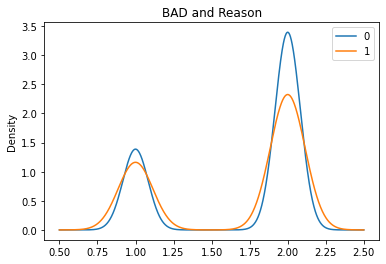

In [ ]:
# Apa hubungan alasan mengambil pinjaman dengan gagal bayar
data.groupby('BAD')['Reason Code'].plot.density(title='BAD and Reason')
plt.legend()
plt.show()

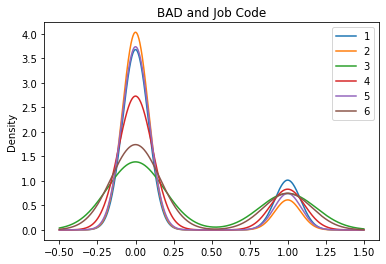

In [ ]:
# Apa hubungan pekerjaan dengan gagal bayar
data.groupby('Job Code')['BAD'].plot.density(title='BAD and Job Code')
plt.legend()
plt.show()

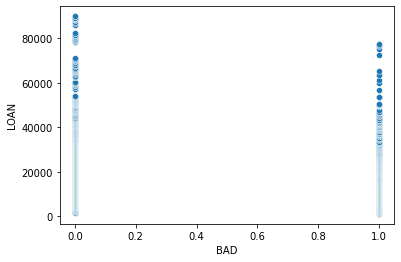

In [ ]:
# Hubungan Gagal bayar dan jumlah permintaan hutang?
sns.scatterplot(data=data, x='BAD', y='LOAN')
plt.show()

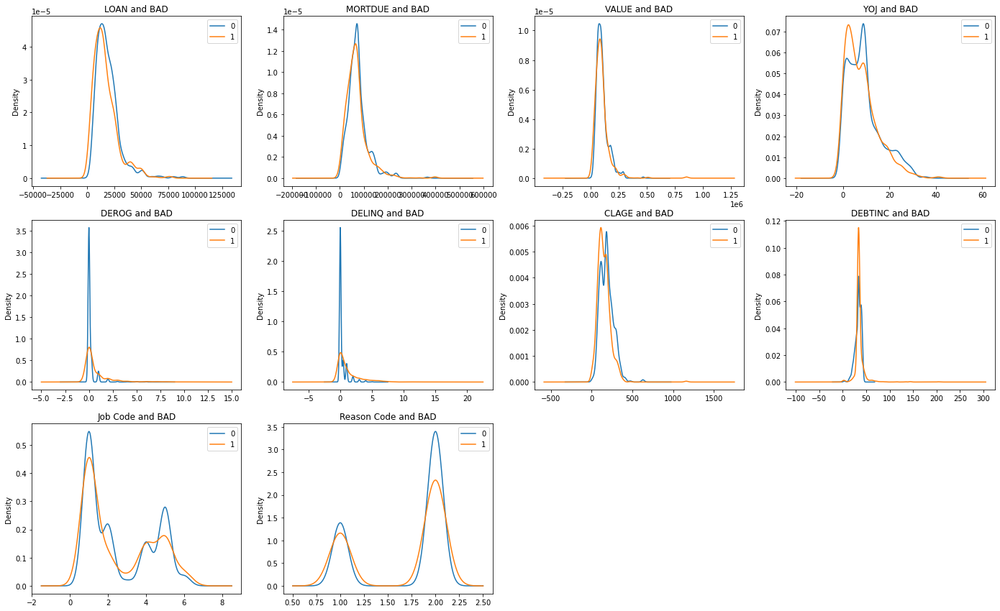

In [ ]:
columns = ['LOAN','MORTDUE','VALUE','YOJ','DEROG','DELINQ','CLAGE','DEBTINC','Job Code','Reason Code']

pos = 1
plt.figure(figsize=(24, 20))
for column in columns:
    plt.subplot(4, 4, pos)
    data.groupby('BAD')[column].plot.density(title= column + ' and BAD')
    plt.legend()
    pos = pos + 1

plt.show()

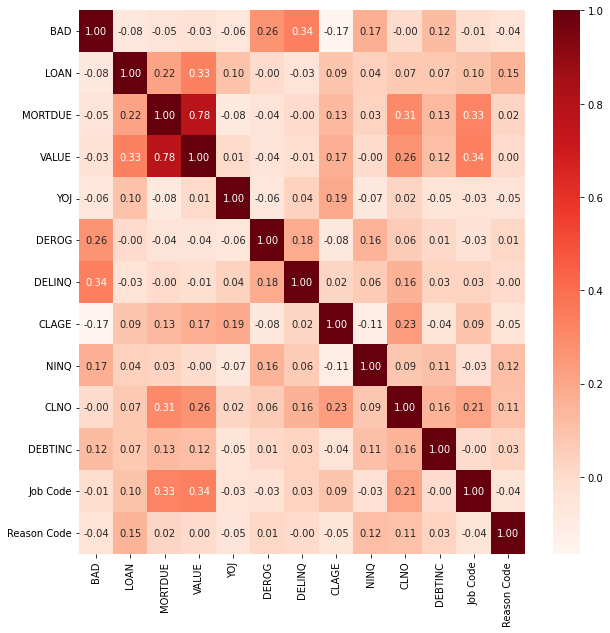

In [ ]:
#bivariate analysis
#corelation heatmap
plt.figure(figsize=(10,10))
sns.heatmap(data.corr(), cmap="Reds", annot=True, fmt=".2f")

In [ ]:
!pip install autoviz

     |████████████████████████████████| 59 kB 2.7 MB/s 
     |████████████████████████████████| 3.1 MB 11.7 MB/s 
     |████████████████████████████████| 12.9 MB 28.0 MB/s 
     |████████████████████████████████| 18.5 MB 613 kB/s 
     |████████████████████████████████| 11.2 MB 34.0 MB/s 
     |████████████████████████████████| 170 kB 69.5 MB/s 
     |████████████████████████████████| 88 kB 7.3 MB/s 
     |████████████████████████████████| 890 kB 37.9 MB/s 
  Created wheel for emoji: filename=emoji-1.6.1-py3-none-any.whl size=169314 sha256=84f94331abe75ca86add7996b166bd8503046d71db820ca1d78e73f55fa86fae
  Stored in directory: /root/.cache/pip/wheels/ea/5f/d3/03d313ddb3c2a1a427bb4690f1621eea60fe6f2a30cc95940f
Successfully built emoji
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.3.3
    Uninstalling bokeh-2.3.3:
      Successfully uninstalled bokeh-2.3.3
  Attempting uninstall: panel
    Found existing installation: panel 0.12.1
    Uninstalling panel-0.12.1:
  

Alert! from autoviz version 0.1.35, after importing, you must %matplotlib inline to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
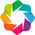

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Shape of your Data Set loaded: (5960, 13)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    13 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 45
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5955,0,88900,57264.0,90185.0,DebtCon,Other,16.0,0.0,0.0,221.808718,0.0,16.0,36.112347
5956,0,89000,54576.0,92937.0,DebtCon,Other,16.0,0.0,0.0,208.692070,0.0,15.0,35.859971
5957,0,89200,54045.0,92924.0,DebtCon,Other,15.0,0.0,0.0,212.279697,0.0,15.0,35.556590
5958,0,89800,50370.0,91861.0,DebtCon,Other,14.0,0.0,0.0,213.892709,0.0,16.0,34.340882


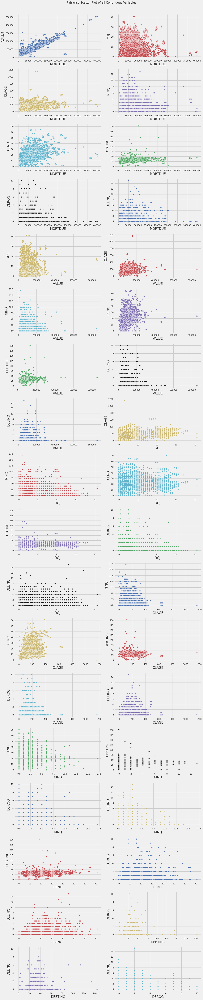

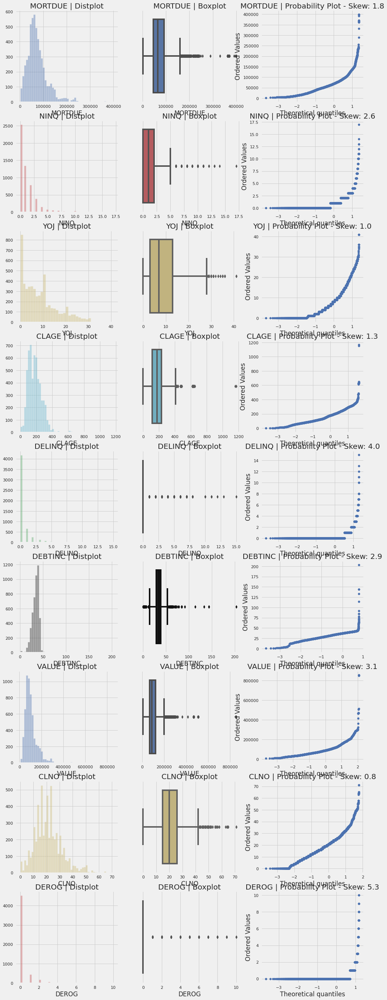

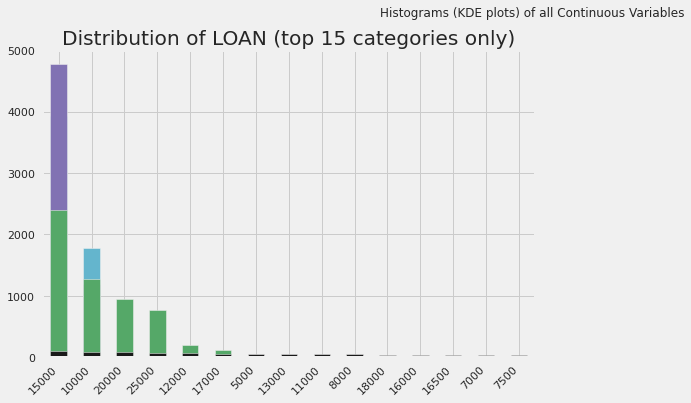

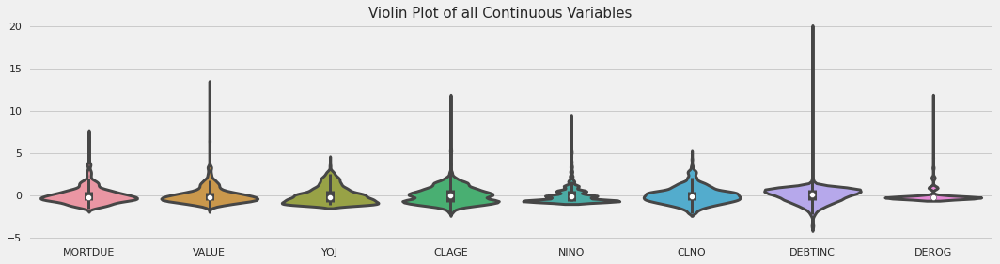

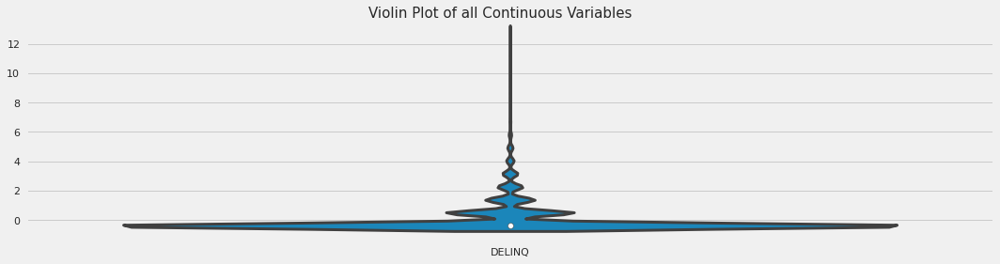

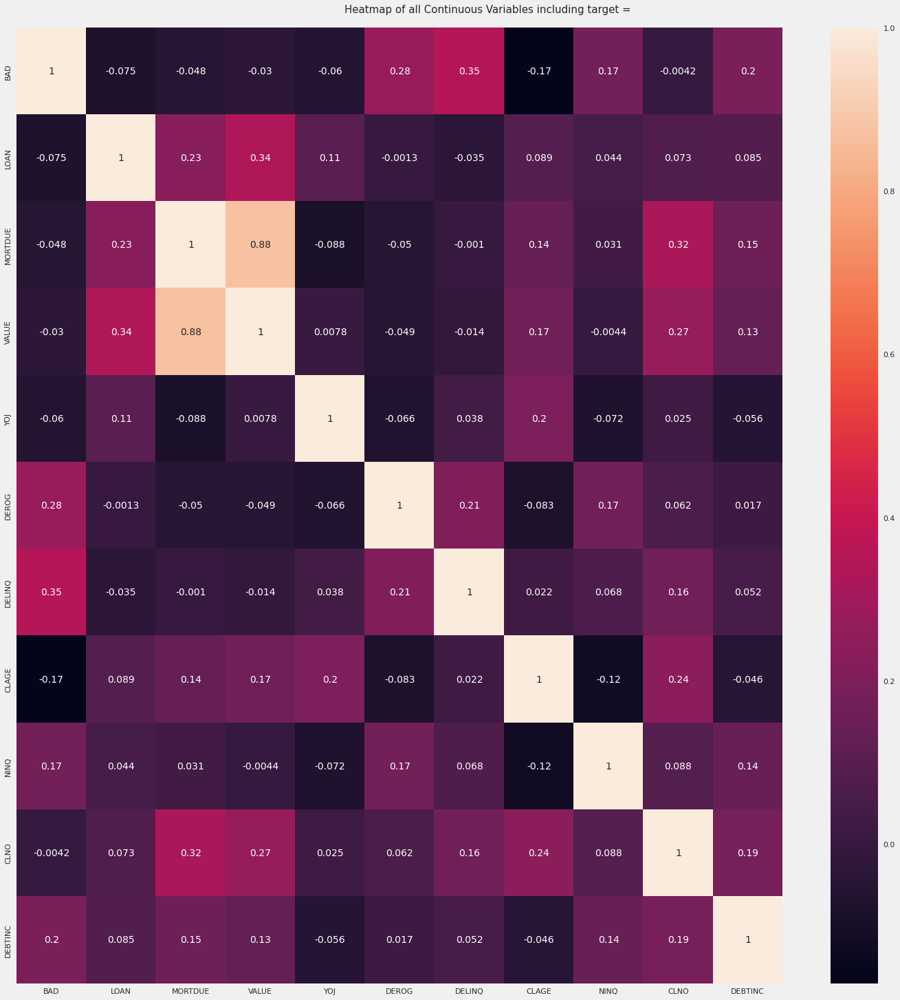

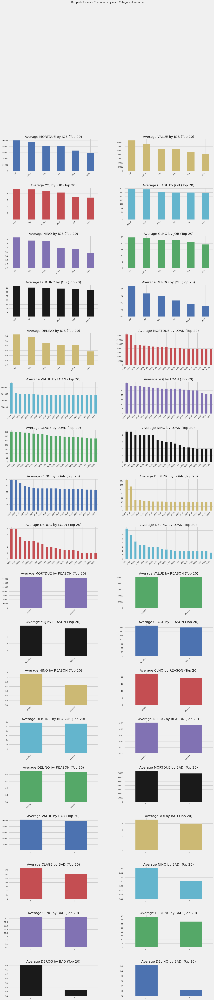

In [ ]:
AV.AutoViz(path)

# Feature Mixing

In [ ]:
data.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
0,1,1100,25860.0000,39025.000000,HomeImp,Other,10.500000,0.00000,0.000000,94.366667,1.000000,9.000000,33.779915,1,1
1,1,1300,70053.0000,68400.000000,HomeImp,Other,7.000000,0.00000,2.000000,121.833333,0.000000,14.000000,33.779915,1,1
2,1,1500,13500.0000,16700.000000,HomeImp,Other,4.000000,0.00000,0.000000,149.466667,1.000000,10.000000,33.779915,1,1
3,1,1500,73760.8172,101776.048741,DebtCon,Other,8.922268,0.25457,0.449442,179.766275,1.186055,21.296096,33.779915,1,2
4,0,1700,97800.0000,112000.000000,HomeImp,Office,3.000000,0.00000,0.000000,93.333333,0.000000,14.000000,33.779915,2,1


In [ ]:
data_gagalbayar =  data.drop(data[data["BAD"]<1].index)
data_gagalbayar.describe()

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
count,1189.0,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000,1189.000000
mean,1.0,16922.119428,69843.832795,98491.043253,8.076701,0.674641,1.181968,152.130415,1.745125,21.215049,35.680601,2.577796,1.666947
std,0.0,11418.455152,45432.099946,70985.985312,6.906745,1.418515,1.853755,82.442221,2.179729,11.546483,10.646448,1.781417,0.471504
min,1.0,1100.000000,2063.000000,8800.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.524499,1.000000,1.000000
25%,1.0,9200.000000,42077.000000,61917.000000,2.900000,0.000000,0.000000,98.808206,0.000000,14.000000,33.779915,1.000000,1.000000
50%,1.0,14900.000000,63800.000000,86400.000000,7.000000,0.000000,0.449442,138.166667,1.000000,21.000000,33.779915,2.000000,2.000000
75%,1.0,21700.000000,82054.000000,112000.000000,11.000000,1.000000,2.000000,187.266667,2.000000,27.000000,33.779915,4.000000,2.000000
max,1.0,77400.000000,399550.000000,855909.000000,41.000000,10.000000,15.000000,1168.233561,17.000000,71.000000,203.312149,6.000000,2.000000


In [ ]:
data.corr(method='spearman')

,BAD,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
BAD,1.000000,-0.108399,-0.072699,-0.058497,-0.057199,0.180394,0.275451,-0.179528,0.135828,-0.013206,0.038429,-0.020398,-0.037517
LOAN,-0.108399,1.000000,0.184446,0.342396,0.092854,-0.029935,-0.064347,0.116196,0.027325,0.135250,0.106451,0.114296,0.255020
MORTDUE,-0.072699,0.184446,1.000000,0.764013,-0.048412,0.002049,-0.019176,0.124151,0.049787,0.297970,0.132696,0.294978,0.031846
VALUE,-0.058497,0.342396,0.764013,1.000000,0.025666,-0.051019,-0.054553,0.181469,-0.007718,0.351569,0.143864,0.366160,0.041764
YOJ,-0.057199,0.092854,-0.048412,0.025666,1.000000,-0.050899,0.009833,0.166538,-0.069874,0.037607,-0.053362,-0.011351,-0.045316
DEROG,0.180394,-0.029935,0.002049,-0.051019,-0.050899,1.000000,0.413499,-0.055897,0.256388,0.067556,0.002651,-0.081323,0.048242
DELINQ,0.275451,-0.064347,-0.019176,-0.054553,0.009833,0.413499,1.000000,-0.011558,0.150146,0.131458,-0.011329,-0.042534,-0.000109
CLAGE,-0.179528,0.116196,0.124151,0.181469,0.166538,-0.055897,-0.011558,1.000000,-0.095851,0.229156,0.011918,0.097403,-0.018584
NINQ,0.135828,0.027325,0.049787,-0.007718,-0.069874,0.256388,0.150146,-0.095851,1.000000,0.138684,0.115902,-0.049138,0.133627
CLNO,-0.013206,0.135250,0.297970,0.351569,0.037607,0.067556,0.131458,0.229156,0.138684,1.000000,0.157106,0.235513,0.135675


# Train Test Split

In [ ]:
data.dropna(inplace=True)

In [ ]:
data.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,Job Code,Reason Code
0,1,1100,25860.0000,39025.000000,HomeImp,Other,10.500000,0.00000,0.000000,94.366667,1.000000,9.000000,33.779915,1,1
1,1,1300,70053.0000,68400.000000,HomeImp,Other,7.000000,0.00000,2.000000,121.833333,0.000000,14.000000,33.779915,1,1
2,1,1500,13500.0000,16700.000000,HomeImp,Other,4.000000,0.00000,0.000000,149.466667,1.000000,10.000000,33.779915,1,1
3,1,1500,73760.8172,101776.048741,DebtCon,Other,8.922268,0.25457,0.449442,179.766275,1.186055,21.296096,33.779915,1,2
4,0,1700,97800.0000,112000.000000,HomeImp,Office,3.000000,0.00000,0.000000,93.333333,0.000000,14.000000,33.779915,2,1


In [ ]:
from sklearn.model_selection import train_test_split

X = data.drop(['BAD','REASON','JOB','CLNO'], axis=1)
y = data['BAD']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

In [ ]:
data['BAD'].value_counts()

0    4771
1    1189
Name: BAD, dtype: int64

# Scaling Dataset

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)
X_train.head()

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,DEBTINC,Job Code,Reason Code
0,-0.416565,0.268052,-0.005775,-1.230677,-0.313790,-0.414219,-0.411732,-0.722314,0.869505,-0.918047,0.653542
1,0.133599,2.031861,1.757651,-0.540663,3.408328,6.013943,0.304949,2.336785,0.010147,1.362660,0.653542
2,-0.091878,1.384628,0.907090,0.000621,-0.313790,-0.414219,0.437272,-0.722314,0.509805,0.792483,0.653542
3,-0.768309,-0.391611,-0.511106,0.425357,-0.313790,-0.414219,0.921854,-0.722314,0.010147,-0.918047,0.653542
4,0.873163,0.823623,1.809815,1.943387,-0.313790,-0.414219,-0.004841,-0.722314,-1.362421,-0.918047,0.653542


# Balancing dataset

In [ ]:
# Label proportion
pd.Series(y_train).value_counts()

0    3830
1     938
Name: BAD, dtype: int64

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

undersample = RandomUnderSampler(sampling_strategy='majority')
X_under, y_under = undersample.fit_resample(X_train, y_train)

In [ ]:
pd.Series(y_under).value_counts()

1    938
0    938
Name: BAD, dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTE

oversample = SMOTE()
X_over, y_over = oversample.fit_resample(X_train, y_train)

In [ ]:
pd.Series(y_over).value_counts()

1    3830
0    3830
Name: BAD, dtype: int64

# Training Model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import confusion_matrix

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost
from sklearn.metrics import confusion_matrix

def multiclass_eval (y_true, y_pred, name=''):
    """
    Multiclass evaluation function. This function only focus on Accuracy,
    Recall and Precision of each class.
    
    Parameters
    ----------
    
    y_true:    array
        target of prediction
    
    y_pred:    array
        predicted target

    name:  String
        Name of Model
    
    Printed Information
    -------------------
    1. Confusion Matrix
    2. Accuracy
    3. Recall of each class
    4. Precision of each class
    """
    cm = confusion_matrix(y_true, y_pred)
    # Number of Classes
    classes = cm.shape[0]

    # Define Placeholder
    true_vals = []
    actual_side = []
    pred_side = []

    # Loop to get the result
    for i in range(0, classes):
        true_vals.append(cm[i][i])
        actual_side.append(sum(cm[i]))
        pred_side.append(sum(cm.T[i]))

    # Accuracy
    accuracy = sum(true_vals) / sum(actual_side)
    print(name, 'Model Performance')
    print(cm, '\n')
    print('Accuracy          :', round(accuracy * 100, 1), '%')

    # Loop to get Recall and Precision
    for i in range(0, classes):
        print('\nClass', i, 'Overview:')
        recall    = true_vals[i] / actual_side[i]
        precision = true_vals[i] / pred_side[i]
        f1_score = (2 * precision * recall) / (precision + recall)
        print('Recall Class', i,'   :', round(recall * 100, 1), '%')
        print('Precision Class', i,':', round(precision * 100, 1), '%')
        print('F1 Score  Class', i,':', round(f1_score * 100, 1), '%')

In [ ]:
# Logreg Training
logreg = LogisticRegression()
logreg.fit(X_over, y_over)

LogisticRegression()

In [ ]:
y_pred_tr = logreg.predict(X_over)
y_pred_ts = logreg.predict(X_test)

In [ ]:
# Performance training
multiclass_eval(y_over, y_pred_tr, name='Logreg - Training')

Logreg - Training Model Performance
[[2992  838]
 [1331 2499]] 

Accuracy          : 71.7 %

Class 0 Overview:
Recall Class 0    : 78.1 %
Precision Class 0 : 69.2 %
F1 Score  Class 0 : 73.4 %

Class 1 Overview:
Recall Class 1    : 65.2 %
Precision Class 1 : 74.9 %
F1 Score  Class 1 : 69.7 %


In [ ]:
# Performance testing
multiclass_eval(y_test, y_pred_ts, name='Logreg - Testing')

Logreg - Testing Model Performance
[[728 213]
 [ 81 170]] 

Accuracy          : 75.3 %

Class 0 Overview:
Recall Class 0    : 77.4 %
Precision Class 0 : 90.0 %
F1 Score  Class 0 : 83.2 %

Class 1 Overview:
Recall Class 1    : 67.7 %
Precision Class 1 : 44.4 %
F1 Score  Class 1 : 53.6 %


In [ ]:
# Logreg Training
logreg = LogisticRegression()
logreg.fit(X_under, y_under)

LogisticRegression()

In [ ]:
y_pred_tr = logreg.predict(X_under)
y_pred_ts = logreg.predict(X_test)

In [ ]:
# Performance training
multiclass_eval(y_under, y_pred_tr, name='Logreg - Training')

Logreg - Training Model Performance
[[753 185]
 [340 598]] 

Accuracy          : 72.0 %

Class 0 Overview:
Recall Class 0    : 80.3 %
Precision Class 0 : 68.9 %
F1 Score  Class 0 : 74.2 %

Class 1 Overview:
Recall Class 1    : 63.8 %
Precision Class 1 : 76.4 %
F1 Score  Class 1 : 69.5 %


In [ ]:
# Performance testing
multiclass_eval(y_test, y_pred_ts, name='Logreg - Testing')

Logreg - Testing Model Performance
[[747 194]
 [ 87 164]] 

Accuracy          : 76.4 %

Class 0 Overview:
Recall Class 0    : 79.4 %
Precision Class 0 : 89.6 %
F1 Score  Class 0 : 84.2 %

Class 1 Overview:
Recall Class 1    : 65.3 %
Precision Class 1 : 45.8 %
F1 Score  Class 1 : 53.9 %


XGBOOST

In [93]:
from sklearn.metrics import accuracy_score,f1_score,roc_auc_score,confusion_matrix
import xgboost
xgb=xgboost.XGBClassifier(max_depth=10,n_estimators=100, base_score=0.6)
xgb.fit(X_train,y_train)
y_pred_xg=xgb.predict(X_test)

print("Accuracy Score :" + " {:.2%}".format(accuracy_score(y_test,y_pred_xg)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_test,y_pred_xg)))
print('ROC_AUC_Score :' + " {:.2%}".format(roc_auc_score(y_test,y_pred_xg)))
print(confusion_matrix(y_test,y_pred_xg))

Accuracy Score : 92.03%
F1_Score : 79.57%
ROC_AUC_Score : 85.31%
[[912  29]
 [ 66 185]]


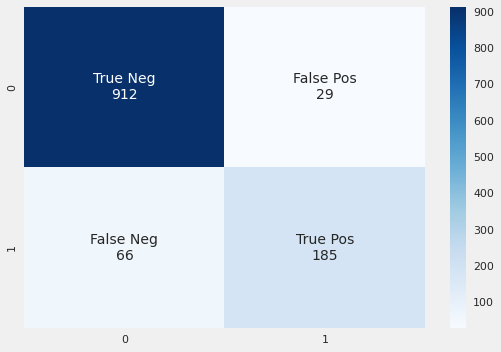

In [94]:
matrix_xgb=confusion_matrix(y_test,y_pred_xg)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_xgb.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_xgb, annot=labels, fmt='', cmap='Blues')

In [95]:
#XGBOOST UNDER SAMPLING
print("XG BOOST UNDER SAMPLING \n")

xgbunder=xgboost.XGBClassifier(max_depth=10,n_estimators=100, base_score=0.6)
xgbunder.fit(X_under,y_under)
y_pred_xgunder=xgbunder.predict(X_under)


print('Accuracy Score :' + " {:.2%}".format(accuracy_score(y_under,y_pred_xgunder)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_under,y_pred_xgunder)))
print('ROC_AUC_Score' + " {:.2%}".format(roc_auc_score(y_under,y_pred_xgunder)))
print(confusion_matrix(y_under,y_pred_xgunder))

XG BOOST UNDER SAMPLING 

Accuracy Score : 99.95%
F1_Score : 99.95%
ROC_AUC_Score 99.95%
[[937   1]
 [  0 938]]


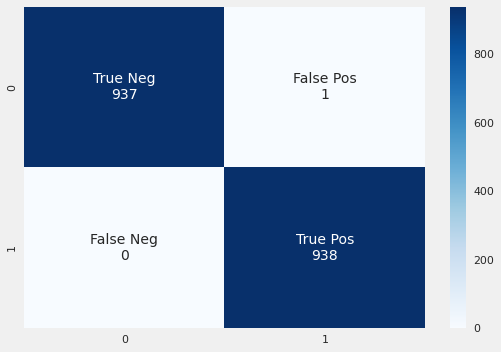

In [97]:
matrix_xgbu=confusion_matrix(y_under,y_pred_xgunder)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_xgbu.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_xgbu, annot=labels, fmt='', cmap='Blues')

In [96]:
#XGBOOST OVER SAMPLING
print("XG BOOST OVER SAMPLING \n")

xgbover=xgboost.XGBClassifier(max_depth=10,n_estimators=100, base_score=0.6)
xgbover.fit(X_over,y_over)
y_pred_xgover=xgbover.predict(X_over)


print('Accuracy Score :' + " {:.2%}".format(accuracy_score(y_over,y_pred_xgover)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_over,y_pred_xgover)))
print('ROC_AUC_Score' + " {:.2%}".format(roc_auc_score(y_over,y_pred_xgover)))
print(confusion_matrix(y_over,y_pred_xgover))

XG BOOST OVER SAMPLING 

Accuracy Score : 99.87%
F1_Score : 99.87%
ROC_AUC_Score 99.87%
[[3825    5]
 [   5 3825]]


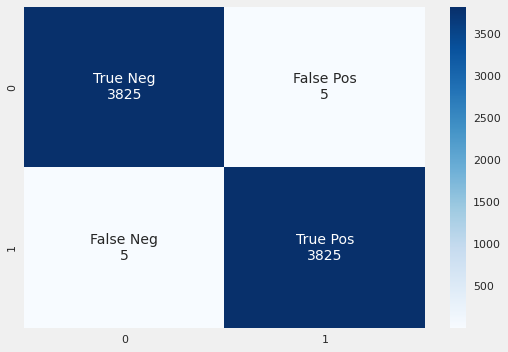

In [98]:
matrix_xgbo=confusion_matrix(y_over,y_pred_xgover)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_xgbo.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_xgbo, annot=labels, fmt='', cmap='Blues')

LIGHT GBM

In [ ]:
import lightgbm
lgbm=lightgbm.LGBMClassifier()
lgbm.fit(X_train,y_train)
y_pred_lgbm=lgbm.predict(X_test)

print('Accuracy Score :' + " {:.2%}".format(accuracy_score(y_test,y_pred_lgbm)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_test,y_pred_lgbm)))
print('ROC_AUC_Score :' + " {:.2%}".format(roc_auc_score(y_test,y_pred_lgbm)))
print(confusion_matrix(y_test,y_pred_lgbm))

Accuracy Score : 93.04%
F1_Score : 81.92%
ROC_AUC_Score : 86.39%
[[921  20]
 [ 63 188]]


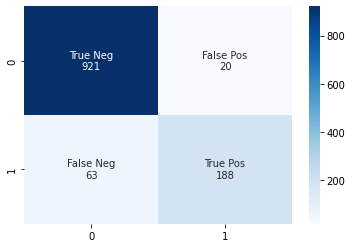

In [ ]:
matrix_lgbm=confusion_matrix(y_test,y_pred_lgbm)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_lgbm.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_lgbm, annot=labels, fmt='', cmap='Blues')

In [ ]:
#LIGHT GBM UNDER SAMPLING
print("Light GBM Under Sampling \n")

lgbm_under=lightgbm.LGBMClassifier()
lgbm_under.fit(X_under,y_under)
y_pred_lgbmu=lgbm_under.predict(X_under)

print('Accuracy Score :' + " {:.2%}".format(accuracy_score(y_under,y_pred_lgbmu)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_under,y_pred_lgbmu)))
print('ROC_AUC_Score' + " {:.2%}".format(roc_auc_score(y_under,y_pred_lgbmu)))
print(confusion_matrix(y_under,y_pred_lgbmu))

Light GBM Under Sampling 

Accuracy Score : 99.63%
F1_Score : 99.63%
ROC_AUC_Score 99.63%
[[934   4]
 [  3 935]]


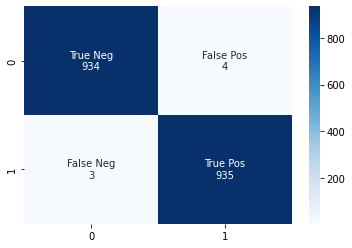

In [ ]:
matrix_lgbmu=confusion_matrix(y_under,y_pred_lgbmu)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_lgbmu.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_lgbmu, annot=labels, fmt='', cmap='Blues')

In [ ]:
#LIGHT GBM OVER SAMPLING
print("Light GBM Over Sampling \n")

lgbm_over=lightgbm.LGBMClassifier()
lgbm_over.fit(X_under,y_under)
y_pred_lgbmo=lgbm_under.predict(X_over)

print('Accuracy Score :' + " {:.2%}".format(accuracy_score(y_over,y_pred_lgbmo)))
print('F1_Score :' + " {:.2%}".format(f1_score(y_over,y_pred_lgbmo)))
print('ROC_AUC_Score' + " {:.2%}".format(roc_auc_score(y_over,y_pred_lgbmo)))
print(confusion_matrix(y_over,y_pred_lgbmo))

Light GBM Over Sampling 

Accuracy Score : 89.79%
F1_Score : 89.71%
ROC_AUC_Score 89.79%
[[3468  362]
 [ 420 3410]]


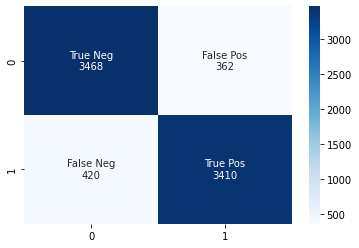

In [ ]:
matrix_lgbmo=confusion_matrix(y_over,y_pred_lgbmo)
group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                matrix_lgbmo.flatten()]
labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(matrix_lgbmo, annot=labels, fmt='', cmap='Blues')